JAVELIN
=======

A Brief Introduction to JAVELIN
-------------------------------

Like pyCCF and pyZDCF, JAVELIN is another technique to find the correlation between two (or more) signals to obtain a time lag between them. pyCCF utilizes piecewise linear interpolation, while pyZDCF utilizes the discrete correlation function. 

JAVELIN utilizes interpolation similar to pyCCF, but does so with the Damped Random Walk (DRW) model. However, JAVELIN also assumes a tophat transfer function, that is convolved with the continuum and emission line light curves. For more information, see either the original SPEAR code, or the JAVELIN code directly.

In simpler terms, JAVELIN interpolates the light curves witha DRW model, assuming that the transfer function describing the time lag is a tophat function. Unlike the other methods, JAVELIN is able to fit multiple lines and the continuum.

Thus, JAVELIN will always fit for the DRW parameters ($\sigma_{\rm DRW}, \tau_{\rm DRW}$) and three tophat parameters ( lag/center, scale, and width ) for each line.

JAVELIN Module Arguments
------------------------

* ``rm_type``: The type of reverberation mapping (RM) analysis to perform. Can either be "spec" for spectroscopic RM, or "phot" for photometric RM. Default is "spec".

* ``lagtobaseline``: JAVELIN will normally use a log prior to penalize lag values larger than x*baseline, where x is ``lagtobasline``. Default is 0.3.

* ``laglimit``: An array specifying the lower and upper limits of the range of lags to search. If "baseline", the range will be set to [-baseline, baseline]. If only one value is given, it will be assumed for all lines, though different ranges may be specified for individual lines. Default is "baseline".

* ``fixed``: A list to determine what parameters to fix/vary when fitting the light curves. This should be an array with a length equal to the number of parameters in the model (i.e. 2 + 3*(number of light curves) ). The fitted parameters will be the two DRW parameters ( log($\sigma_{\rm DRW}$), log($\tau_{\rm DRW}$) ) and three tophat parameters for each non-continuum light curve (lag, width, scale). Setting to 0 will fix the parameter and setting to 1 will allow it to vary. If ``None``, all parameters will be allowed to vary. The fixed parameters must match the fixed value in the array input to the ``p_fix`` argument. Like ``laglimit``, if only one value is given, it will be used for all lines. Default is ``None``.

* ``p_fix``: A list of the fixed parameters, corresponding to the elements of the fixed array. If ``None``, all parameters will be allowed to vary. Default is ``None``.

* ``subtract_mean``: Whether to subtract the mean of the light curve before analysis. Default is ``True``.

* ``nwalkers``: The number of walkers to use in the MCMC. Default is 100.

* ``nburn``: The number of burn-in steps to use in the MCMC. Default is 100.

* ``nchain``: The number of steps to use in the MCMC. Default is 100.

* ``threads``: The number of threads to use in the MCMC. Default is 1.

* ``output_chains``: Whether to output the MCMC chains to a file. Default is ``True``.

* ``output_burn``: Whether to output the MCMC burn-in chains to a file. Default is ``True``.

* ``output_logp``: Whether to output the MCMC log-probability to a file. Default is ``True``.

* ``together``: Whether to fit all of the lines to the continuum together or separately. Default is ``False``.

* ``nbin``: The number of bins to use for the output histograms for each parameter. Default is 50.

* ``use_weights``: Whether to use the probabilistic weights described in Grier et al. (2017). Described in one of the following sections. Default is ``False``.



.. note:: For ``laglimit``, ``fixed``, and ``p_fix``, if multiple lines are input only one value is given, the same value will be used for all lines. Different arrays may also be given for each line.

.. warning:: If ``use_for_javelin=True`` in the DRW Rejection module and ``p_fix``/``fixed`` are specified, the module will use the DRW parameters from the DRW Rejection module as the fixed parameters.

.. warning:: JAVELIN cannot utilize multiple bands for photometric RM, so ``together`` must be set to ``False`` if ``rm_type=phot``.

Using the JAVELIN Module
------------------------

Before running JAVELIN, we'll give a brief description of what it does. If the DRW parameters are not held fixed, PETL will first fit the continuum light curve to a DRW (using JAVELIN's software). JAVELIN uses its own MCMC and modeling algorithms, as opposed to the DRW Rejection module. 

If ``verbose=True``, the posteriors of these parameters $(\log(\sigma_{\rm DRW}), \log(\tau_{\rm DRW}))$ will be shown with histograms of the MCMC samples. Afterwards, JAVELIN will use the median values of these parameters and their uncertainties as priors for the actual JAVELIN fit.

Then, JAVELIN will fit the light curves (all if ``together=True``, and the continuum and each light curve separately if ``together=False``) to the DRW+tophat model. The MCMC samples will be shown in histograms again, and the median values of these distributions will be used as the fit parameters. Additionally, a corner plot will be shown, showing the correlations between the parameters. 

Afterwards, JAVELIN will be used to predict the light curves at a higher cadence, using the best-fit DRW and tophat parameters.

### A Simple Example

First, we'll run the JAVELIN module on three light curves (the continuum with two lines) with custom parameters:

In [1]:
import pypetal.pipeline as pl

main_dir = 'pypetal/examples/dat/javelin_'
filenames = [ main_dir + 'continuum.dat', main_dir + 'yelm.dat', main_dir + 'zing.dat' ]

line_names = ['continuum', 'line1', 'line2']


Running JAVELIN
--------------------
rm_type: spec
lagtobaseline: 0.1
laglimit: [[0, 200], [0, 500]]
fixed: False
p_fix: False
subtract_mean: True
nwalker: 50
nburn: 50
nchain: 100
threads: 1
output_chains: True
output_burn: True
output_logp: True
nbin: 100
metric: med
together: True
use_weights: False
--------------------
        
start burn-in
nburn: 50 nwalkers: 50 --> number of burn-in iterations: 2500
burn-in finished
save burn-in chains to javelin_output1/javelin/burn_cont.txt
start sampling
sampling finished
acceptance fractions for all walkers are
0.73 0.79 0.74 0.74 0.60 0.76 0.66 0.79 0.69 0.63 0.67 0.59 0.81 0.61 0.66 0.54 0.74 0.67 0.78 0.72 0.67 0.78 0.70 0.65 0.73 0.71 0.69 0.75 0.71 0.66 0.77 0.65 0.69 0.72 0.51 0.78 0.76 0.64 0.74 0.74 0.78 0.71 0.74 0.80 0.67 0.70 0.61 0.75 0.71 0.63
save MCMC chains to javelin_output1/javelin/chain_cont.txt
save logp of MCMC chains to javelin_output1/javelin/logp_cont.txt
HPD of sigma
low:    1.720 med    2.075 hig    2.659
HPD of ta

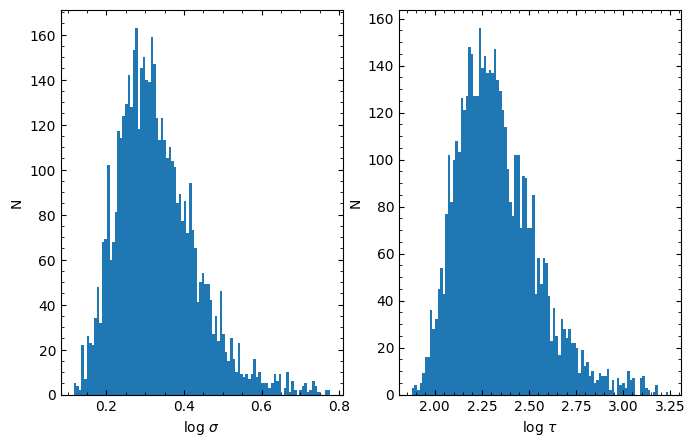

run single chain without subdividing matrix 
start burn-in
using priors on sigma and tau from continuum fitting
[[  1.72  133.908]
 [  2.075 199.827]
 [  2.659 337.361]]
penalize lags longer than 0.10 of the baseline
no penalizing long widths, but within the baseline
nburn: 50 nwalkers: 50 --> number of burn-in iterations: 2500
burn-in finished
save burn-in chains to javelin_output1/javelin/burn_rmap.txt
start sampling
sampling finished
acceptance fractions are
0.14 0.21 0.16 0.22 0.18 0.19 0.25 0.27 0.19 0.23 0.13 0.12 0.27 0.02 0.17 0.21 0.18 0.20 0.19 0.18 0.25 0.33 0.22 0.21 0.03 0.16 0.18 0.21 0.22 0.23 0.13 0.21 0.23 0.28 0.21 0.27 0.04 0.20 0.22 0.15 0.18 0.27 0.12 0.20 0.20 0.22 0.22 0.20 0.31 0.29
save MCMC chains to javelin_output1/javelin/chain_rmap.txt
save logp of MCMC chains to javelin_output1/javelin/logp_rmap.txt
HPD of sigma
low:    2.709 med    3.118 hig    3.694
HPD of tau
low:  190.432 med  214.040 hig  235.195
HPD of lag_line1
low:   97.422 med  101.556 hig  108.74

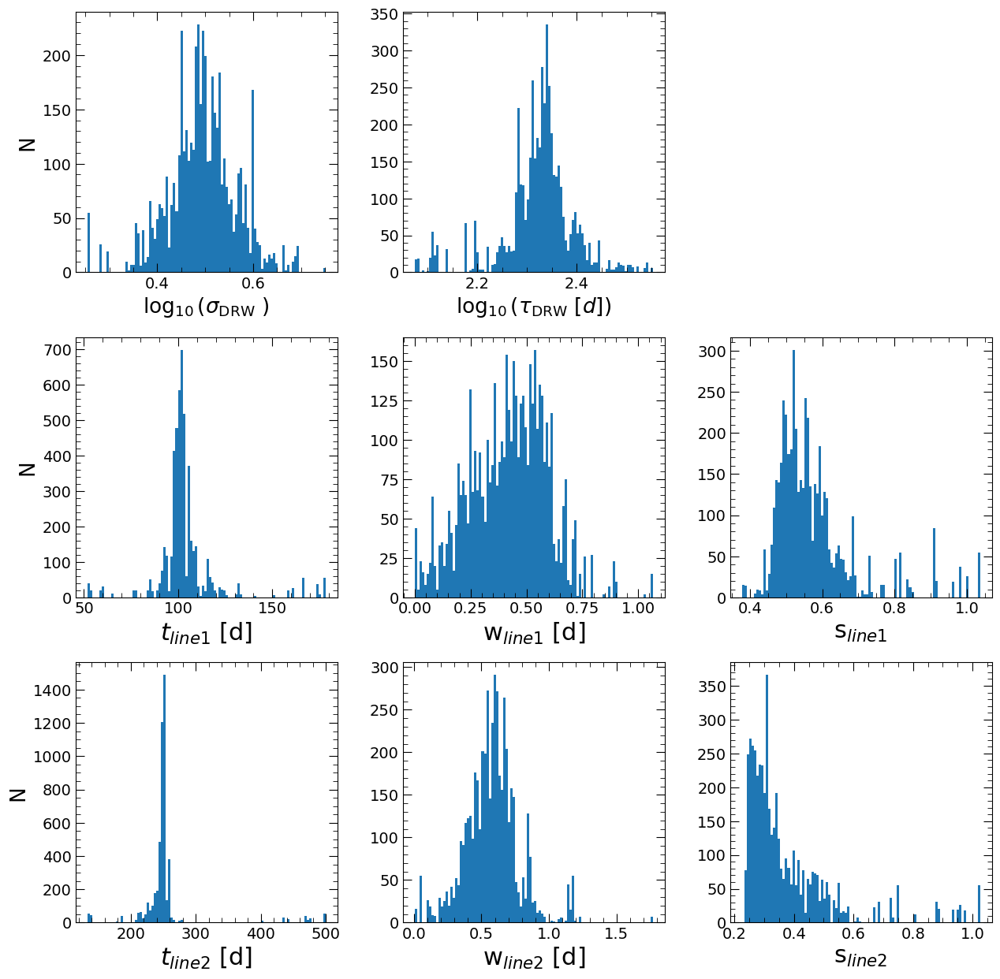

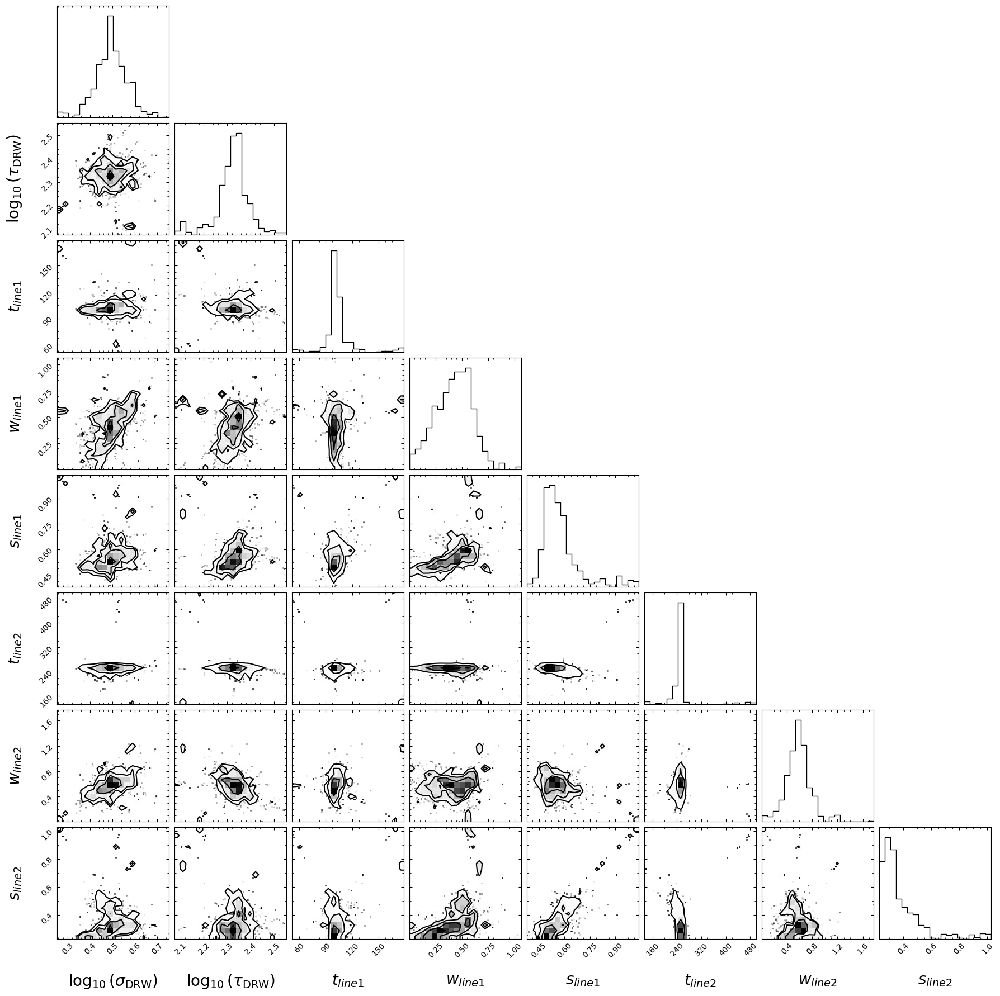

covariance matrix calculated
covariance matrix decomposed and updated by U


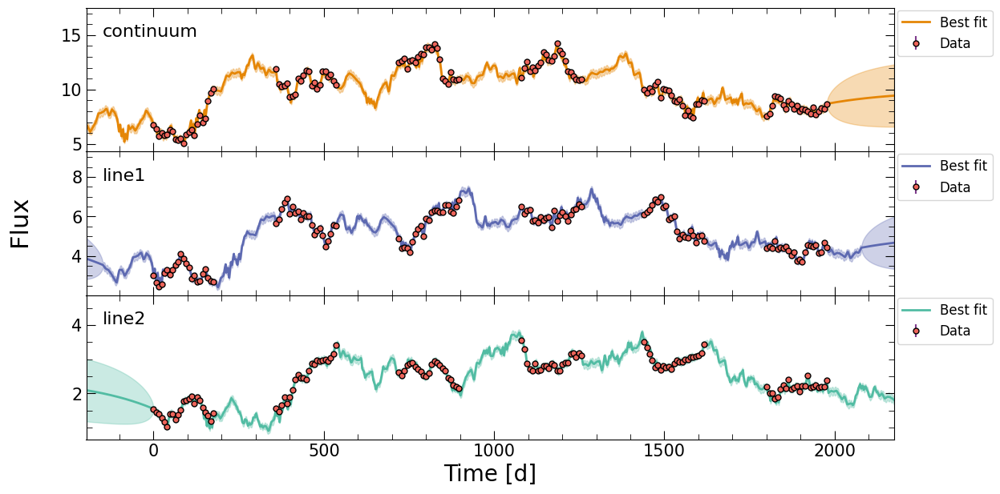

In [2]:
output_dir = 'javelin_output1/'

params = {
    'nwalker': 50,
    'nburn': 50,
    'nchain': 100,
    'lagtobaseline': 0.1, 
    'laglimit': [[0,200],[0,500]],
    'nbin': 100
}

res = pl.run_pipeline( output_dir, filenames, line_names,
                 run_javelin=True,
                 javelin_params=params,
                 verbose=True,
                 plot=True,
                 file_fmt='ascii')

### The ``fixed`` and ``p_fix`` Arguments

When using JAVELIN, it is often useful to fix one or more of the parameters to a specific value. This can be done with the ``fixed`` and ``p_fix`` arguments.

``fixed`` is a list telling JAVELIN which parameters to fix. A 1 corresponds to a varying parameter, while 0 corresponds to a fixed parameter.

``p_fix`` is a list of the value to fix the parameters to. The index of the parameter in ``fixed`` must correspond to the index of the value in ``p_fix``.

The ``fixed`` and ``p_fix`` lists will have a length $2 + 3\cdot(\rm number \, of \, lines)$, where the first two parameters are the DRW parameters, and the next three parameters are the tophat parameters for each line.

$[ \log(\sigma_{\rm DRW}), \log(\tau_{\rm DRW}), t_{\rm line1}, w_{\rm line1}, s_{\rm line2}, t_{line2}, ... ]$

Here we'll fix $\tau_{\rm DRW}$ and the time lag of the first line $(t_{\rm line1})$:


Running JAVELIN
--------------------
rm_type: spec
lagtobaseline: 0.3
laglimit: baseline
fixed: True
p_fix: True
subtract_mean: True
nwalker: 100
nburn: 50
nchain: 100
threads: 1
output_chains: True
output_burn: True
output_logp: True
nbin: 50
metric: med
together: True
use_weights: False
--------------------
        
start burn-in
nburn: 50 nwalkers: 100 --> number of burn-in iterations: 5000
burn-in finished
save burn-in chains to javelin_output2/javelin/burn_cont.txt
start sampling
sampling finished
acceptance fractions for all walkers are
0.66 0.73 0.69 0.69 0.77 0.65 0.81 0.85 0.71 0.80 0.79 0.77 0.80 0.73 0.73 0.76 0.72 0.72 0.71 0.76 0.80 0.82 0.82 0.80 0.76 0.72 0.80 0.75 0.77 0.74 0.75 0.80 0.77 0.76 0.74 0.79 0.79 0.78 0.77 0.73 0.88 0.72 0.79 0.79 0.79 0.75 0.69 0.76 0.85 0.81 0.73 0.74 0.79 0.76 0.85 0.78 0.84 0.77 0.71 0.66 0.73 0.83 0.79 0.63 0.81 0.76 0.78 0.76 0.67 0.74 0.72 0.81 0.80 0.74 0.85 0.73 0.75 0.78 0.70 0.87 0.86 0.78 0.77 0.81 0.72 0.67 0.87 0.78 0.71 0.66 

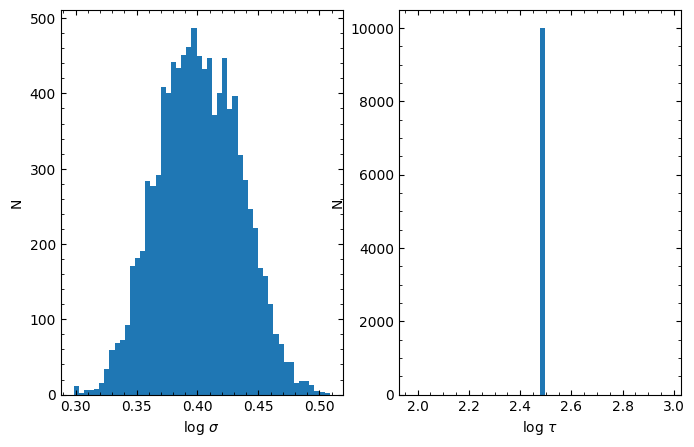

run single chain without subdividing matrix 
start burn-in
using priors on sigma and tau from continuum fitting
[[  2.33  300.   ]
 [  2.515 300.   ]
 [  2.728 300.   ]]
penalize lags longer than 0.30 of the baseline
no penalizing long widths, but within the baseline
nburn: 50 nwalkers: 100 --> number of burn-in iterations: 5000
burn-in finished
save burn-in chains to javelin_output2/javelin/burn_rmap.txt
start sampling
sampling finished
acceptance fractions are
0.08 0.09 0.01 0.08 0.09 0.11 0.07 0.07 0.07 0.10 0.06 0.08 0.10 0.06 0.09 0.14 0.04 0.06 0.06 0.05 0.03 0.09 0.05 0.10 0.03 0.09 0.03 0.05 0.08 0.04 0.12 0.08 0.13 0.07 0.13 0.12 0.04 0.09 0.05 0.08 0.10 0.04 0.15 0.07 0.09 0.07 0.12 0.06 0.12 0.10 0.09 0.07 0.10 0.10 0.04 0.08 0.15 0.02 0.04 0.14 0.08 0.06 0.06 0.14 0.09 0.05 0.06 0.11 0.07 0.03 0.08 0.03 0.11 0.03 0.04 0.09 0.06 0.13 0.09 0.06 0.06 0.09 0.09 0.10 0.10 0.03 0.05 0.09 0.09 0.05 0.11 0.14 0.10 0.04 0.05 0.06 0.08 0.05 0.10 0.07
save MCMC chains to javelin_outpu

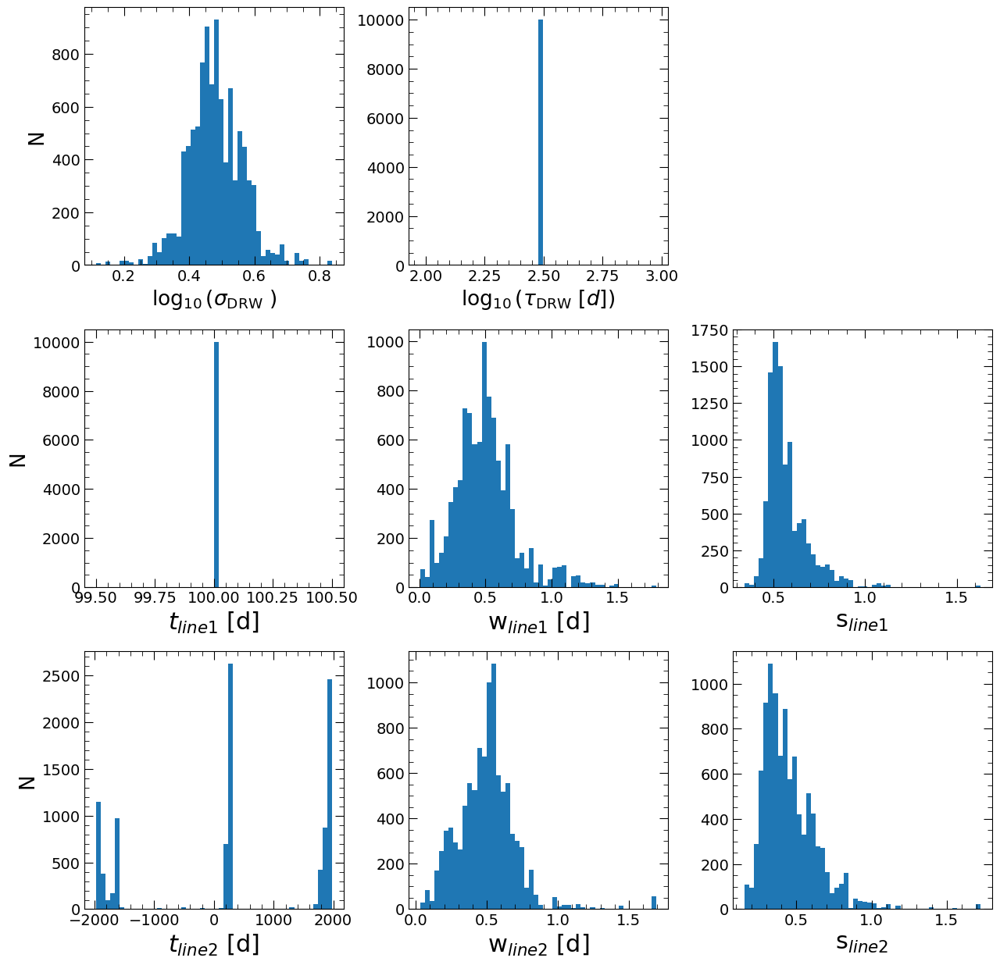

covariance matrix calculated
covariance matrix decomposed and updated by U


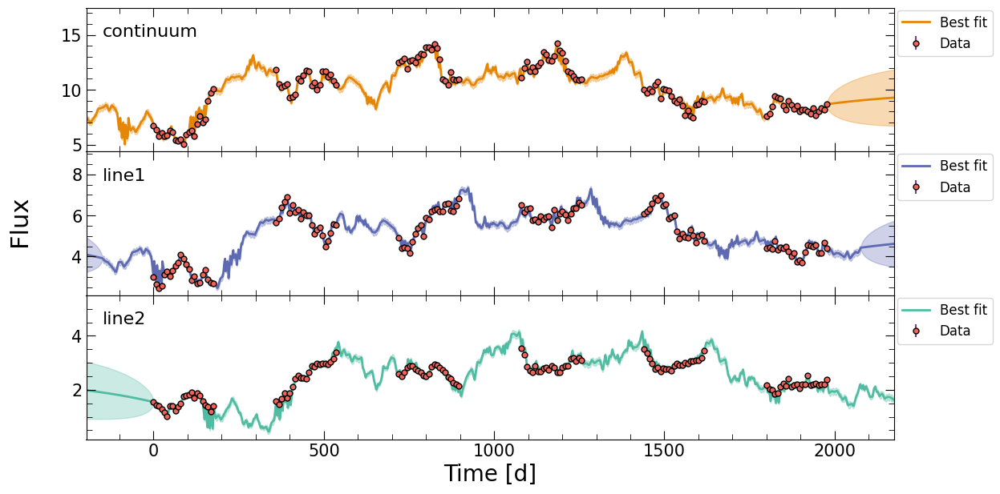

In [3]:
import numpy as np

output_dir = 'javelin_output2/'

params = {
    'nwalker': 100,
    'nburn': 50,
    'nchain': 100,
    'fixed': [1, 0,           0,   1, 1, 1, 1, 1],
    'p_fix': [0, np.log(300), 100, 0, 0, 0, 0, 0],
}

res = pl.run_pipeline( output_dir, filenames, line_names,
                 run_javelin=True,
                 javelin_params=params,
                 verbose=True,
                 plot=True,
                 file_fmt='ascii')

### The ``together`` Argument

By default, JAVELIN will fit each line to the continuum separately. However, in some cases, analysis requires that each line be fit to the continuum together, with the same model. JAVELIN uses this setting by default, which has been implemented in pyPetal with the ``together`` argument for the JAVELIN module.

If ``together=True``, JAVELIN will fit all light curves to the same model. In this case, there will be a directory labeled ``javelin`` in ``output_dir``, containing all of the diagnostic files and figures.

If ``together=False``, each line will be fit to the continuum separately. In this case, there will be a directory labeled ``javelin`` in the subdirectory for each line. This directory will then contain all of the diagnostic files and figures for that line.

We've already seen ``together=False`` in the first example, so now we'll set ``together=True``:


Running JAVELIN
--------------------
rm_type: spec
lagtobaseline: 0.3
laglimit: ['baseline' 'baseline']
fixed: True
p_fix: True
subtract_mean: True
nwalker: 50
nburn: 50
nchain: 100
threads: 1
output_chains: True
output_burn: True
output_logp: True
nbin: 50
metric: med
together: False
use_weights: False
--------------------
        
start burn-in
nburn: 50 nwalkers: 50 --> number of burn-in iterations: 2500
burn-in finished
save burn-in chains to javelin_output3/line1/javelin/burn_cont.txt
start sampling
sampling finished
acceptance fractions for all walkers are
0.71 0.75 0.75 0.72 0.62 0.67 0.65 0.76 0.67 0.63 0.68 0.55 0.77 0.73 0.72 0.63 0.65 0.65 0.71 0.71 0.68 0.75 0.71 0.67 0.71 0.73 0.75 0.72 0.61 0.67 0.68 0.63 0.64 0.67 0.55 0.69 0.77 0.57 0.75 0.71 0.70 0.74 0.67 0.77 0.71 0.68 0.60 0.60 0.63 0.61
save MCMC chains to javelin_output3/line1/javelin/chain_cont.txt
save logp of MCMC chains to javelin_output3/line1/javelin/logp_cont.txt
HPD of sigma
low:    1.733 med    2.174 hig

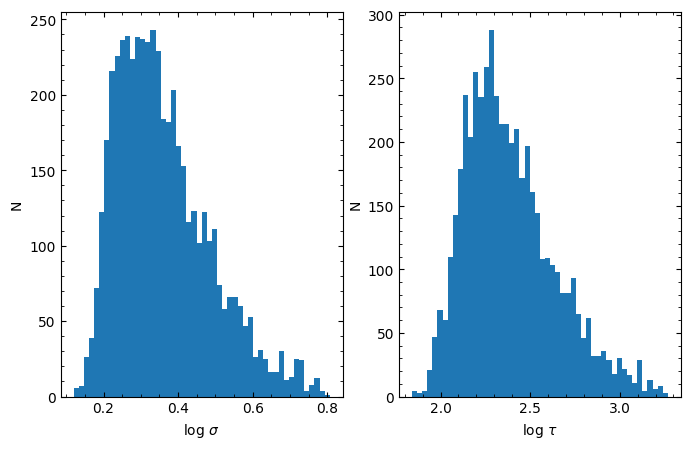

run single chain without subdividing matrix 
start burn-in
using priors on sigma and tau from continuum fitting
[[  1.733 140.236]
 [  2.174 221.416]
 [  3.071 442.185]]
penalize lags longer than 0.30 of the baseline
no penalizing long widths, but within the baseline
nburn: 50 nwalkers: 50 --> number of burn-in iterations: 2500
burn-in finished
save burn-in chains to javelin_output3/line1/javelin/burn_rmap.txt
start sampling
sampling finished
acceptance fractions are
0.04 0.08 0.09 0.01 0.02 0.09 0.06 0.09 0.07 0.02 0.17 0.04 0.06 0.08 0.03 0.05 0.01 0.04 0.13 0.12 0.02 0.03 0.03 0.13 0.06 0.03 0.08 0.10 0.01 0.09 0.12 0.12 0.07 0.04 0.10 0.12 0.09 0.10 0.09 0.04 0.05 0.13 0.02 0.08 0.07 0.01 0.07 0.14 0.04 0.08
save MCMC chains to javelin_output3/line1/javelin/chain_rmap.txt
save logp of MCMC chains to javelin_output3/line1/javelin/logp_rmap.txt
HPD of sigma
low:    1.719 med    2.164 hig    2.583
HPD of tau
low:  151.875 med  196.892 hig  245.028
HPD of lag_line1
low: -1683.046 med  

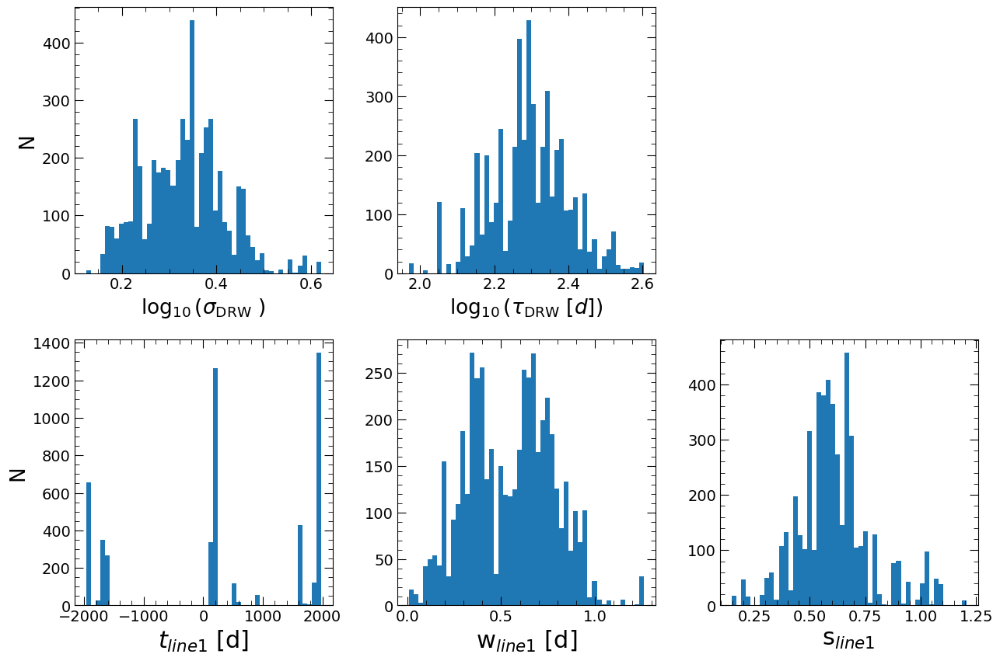

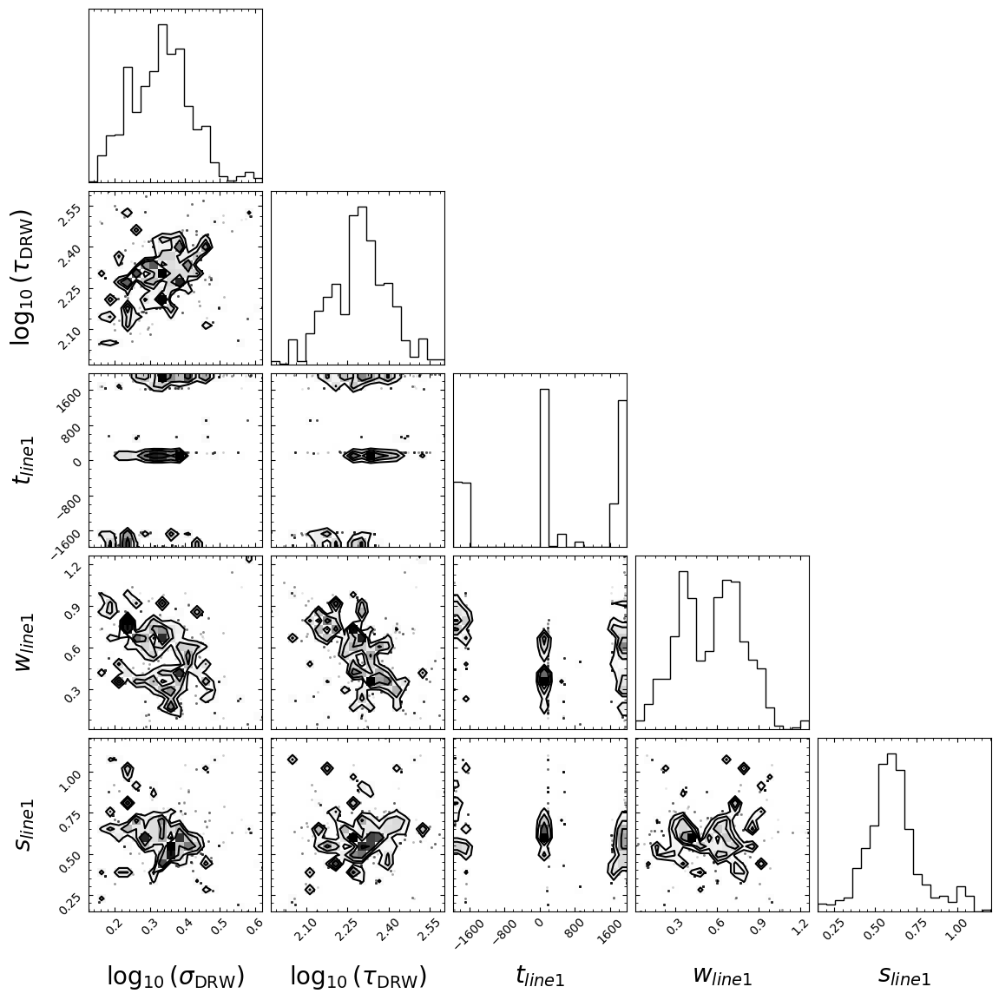

covariance matrix calculated
covariance matrix decomposed and updated by U


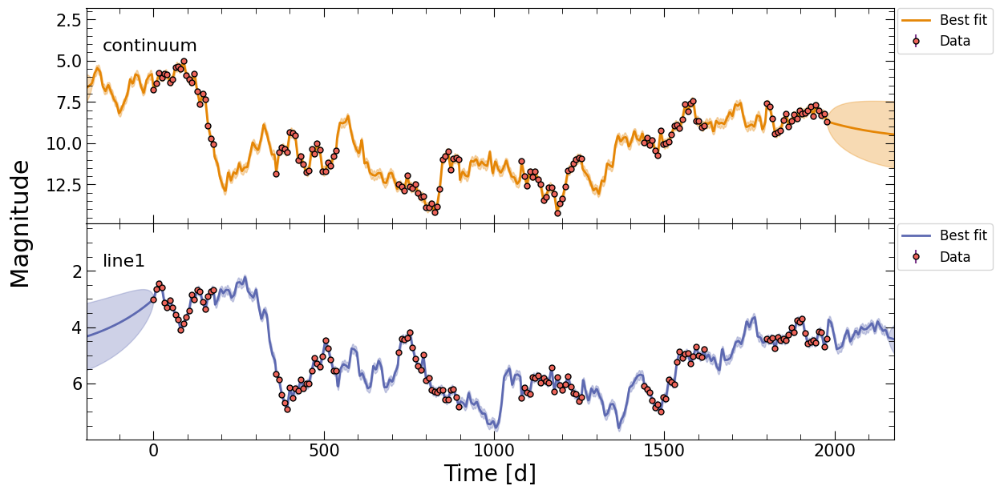

start burn-in
nburn: 50 nwalkers: 50 --> number of burn-in iterations: 2500
burn-in finished
save burn-in chains to javelin_output3/line2/javelin/burn_cont.txt
start sampling
sampling finished
acceptance fractions for all walkers are
0.72 0.68 0.70 0.77 0.67 0.73 0.68 0.71 0.67 0.60 0.70 0.56 0.79 0.69 0.72 0.66 0.74 0.69 0.70 0.73 0.65 0.72 0.75 0.60 0.65 0.70 0.76 0.72 0.64 0.75 0.68 0.70 0.70 0.72 0.57 0.75 0.75 0.70 0.71 0.74 0.69 0.76 0.72 0.76 0.77 0.68 0.62 0.66 0.67 0.50
save MCMC chains to javelin_output3/line2/javelin/chain_cont.txt
save logp of MCMC chains to javelin_output3/line2/javelin/logp_cont.txt
HPD of sigma
low:    1.798 med    2.209 hig    3.073
HPD of tau
low:  141.439 med  221.867 hig  444.854


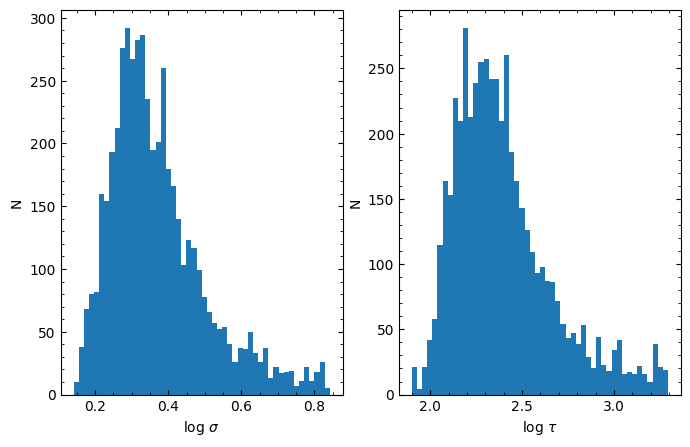

run single chain without subdividing matrix 
start burn-in
using priors on sigma and tau from continuum fitting
[[  1.798 141.439]
 [  2.209 221.867]
 [  3.073 444.854]]
penalize lags longer than 0.30 of the baseline
no penalizing long widths, but within the baseline
nburn: 50 nwalkers: 50 --> number of burn-in iterations: 2500
burn-in finished
save burn-in chains to javelin_output3/line2/javelin/burn_rmap.txt
start sampling
sampling finished
acceptance fractions are
0.06 0.06 0.07 0.05 0.03 0.01 0.01 0.07 0.04 0.02 0.04 0.04 0.08 0.02 0.10 0.03 0.04 0.03 0.02 0.07 0.05 0.10 0.12 0.02 0.06 0.03 0.08 0.14 0.04 0.07 0.13 0.00 0.02 0.06 0.05 0.04 0.07 0.00 0.06 0.02 0.05 0.10 0.11 0.03 0.06 0.11 0.07 0.12 0.12 0.03
save MCMC chains to javelin_output3/line2/javelin/chain_rmap.txt
save logp of MCMC chains to javelin_output3/line2/javelin/logp_rmap.txt
HPD of sigma
low:    1.852 med    2.201 hig    2.615
HPD of tau
low:  182.090 med  236.292 hig  296.586
HPD of lag_line2
low: -1633.101 med  

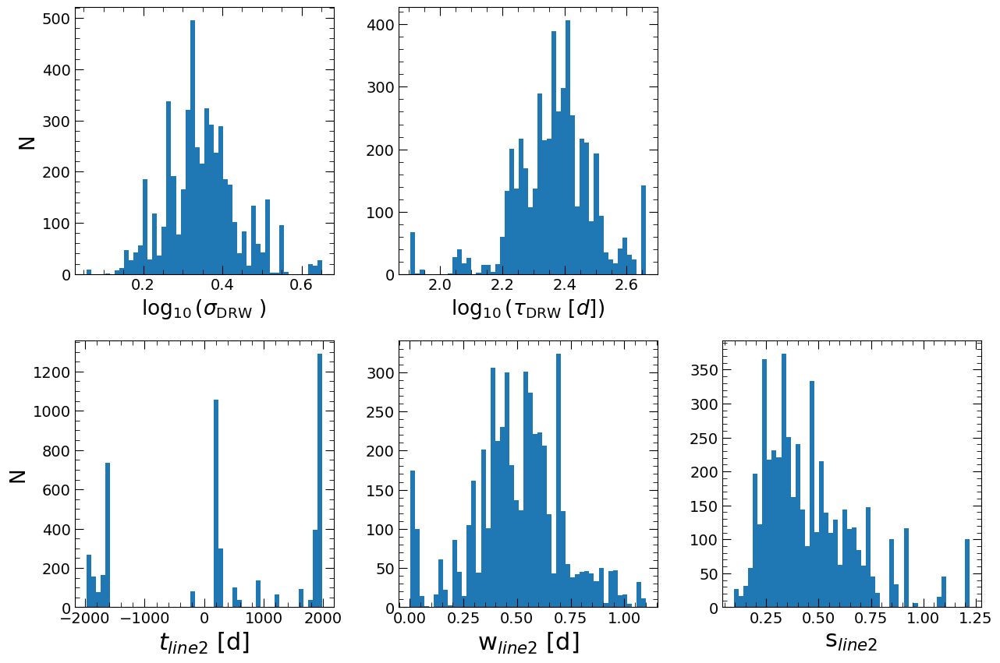

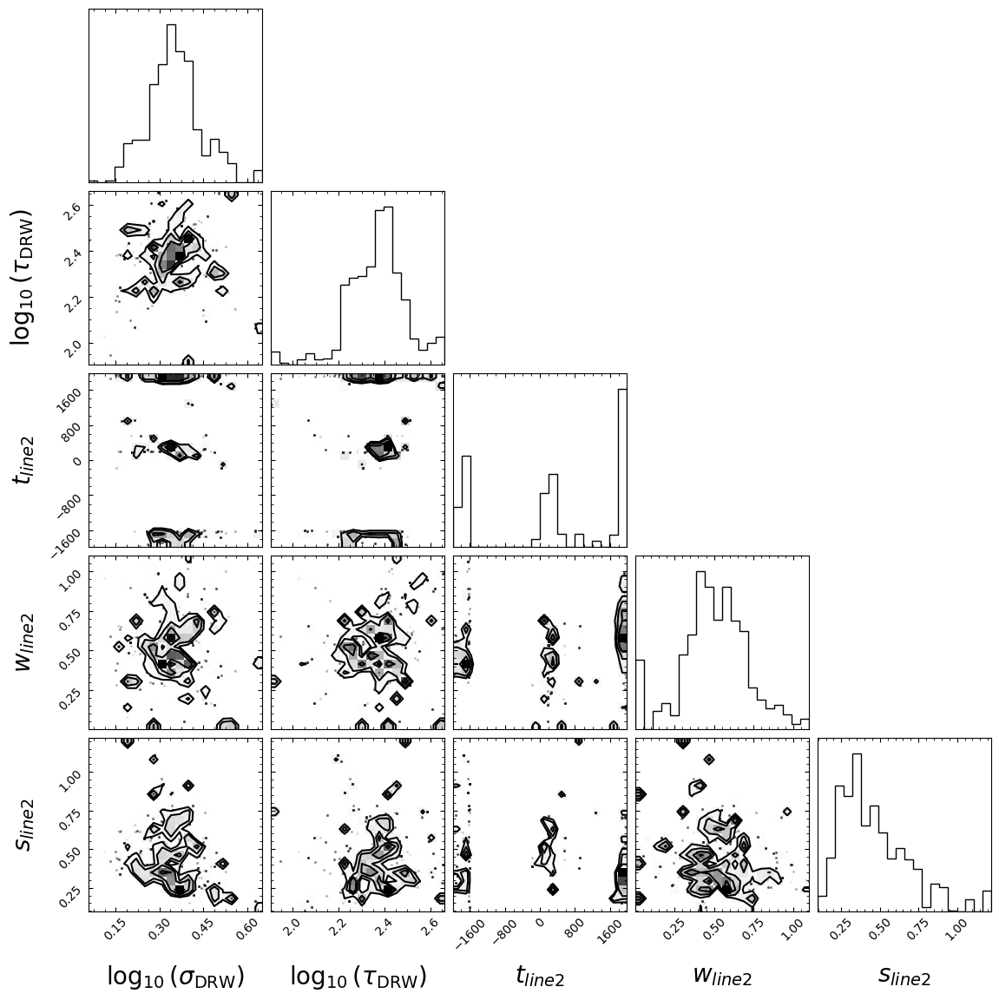

covariance matrix calculated
covariance matrix decomposed and updated by U


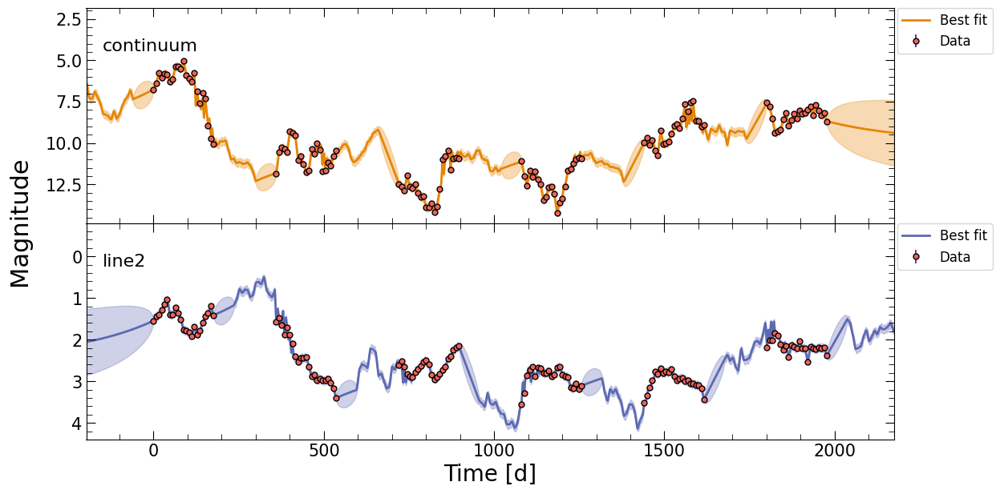

In [4]:
output_dir = 'javelin_output3/'

params = {
    'nwalker': 50,
    'nburn': 50,
    'nchain': 100,
    'together': True
}

res = pl.run_pipeline( output_dir, filenames,line_names,
                 run_javelin=True,
                 javelin_params=params,
                 verbose=True,
                 plot=True,
                 file_fmt='ascii')

This will produce JAVELIN results for each continuum/line combination, instead for all lines together. The output directory will be:

```
    javelin_output3/
    ├── continuum/
    ├── line1/
    ├── line2/
    ├── javelin/
    └── light_curves/
```

### The ``use_weights`` Argument

In some circumstances, the time lag obtained from JAVELIN may have many peaks, and it may be difficult to determine the true time lag.

In order to prevent this issue, <cite data-cite="grier_sloan_2017">Grier et al. (2017)</cite> developed a weighting scheme for the output posterior distribution for the time lag for a given line. If the true lag $\tau$ is large enough that shifting the two light curves by $\tau$ leaves no overlap between the two light curves, then this lag would not be detectable by the data. 

If shifting one light curve by $\tau$ leaves $N(\tau)$ points in the overlap region between the light curves, we expect that we will be able to detect the lag $\tau$ as an increasing function of $N(\tau)$.



<cite data-cite="grier_sloan_2017">Grier et al. (2017)</cite> found that the weighting of the form:

$P(\tau) = [ N(\tau)/ N(0) ]^2$

worked best to remove aliasing in the resulting time lag distribution.

As an example, the two pyCCF sample light curves:

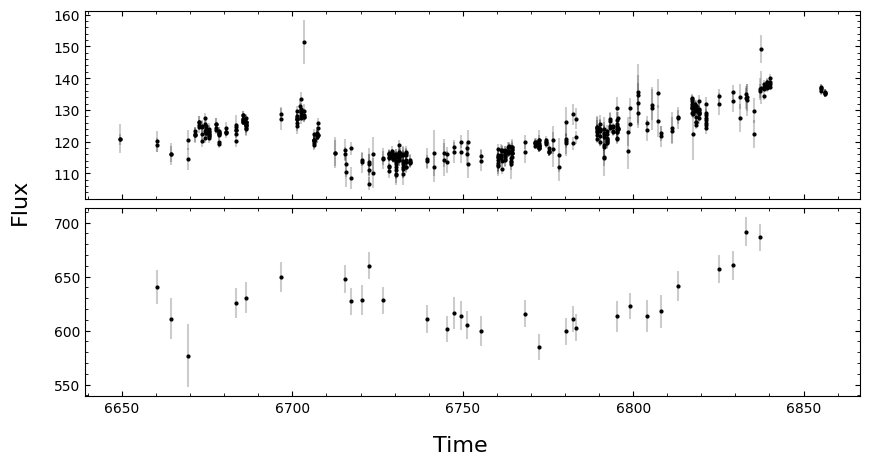

In [5]:
import matplotlib.pyplot as plt


#Load the data
x1, y1, yerr1 = np.loadtxt( 'pypetal/examples/dat/pyccf_lc1.dat', usecols=[0,1,2], unpack=True )
x2, y2, yerr2 = np.loadtxt( 'pypetal/examples/dat/pyccf_lc2.dat', usecols=[0,1,2], unpack=True )


#Plot
fig, ax = plt.subplots(2, 1, sharex=True, figsize=(10,5))

_, _, bars = ax[0].errorbar( x1, y1, yerr1, fmt='.k', ms=4 )
[ bar.set_alpha(.2) for bar in bars ]

_, _, bars = ax[1].errorbar( x2, y2, yerr2, fmt='.k', ms=4 )
[ bar.set_alpha(.2) for bar in bars ]

plt.figtext( .5, 0, 'Time', ha='center', fontsize=16 )
plt.figtext( .05, .5, 'Flux', va='center', fontsize=16, rotation=90 )

plt.subplots_adjust(hspace=.05)
plt.show()

Produces the following weight distribution $P(\tau)$:

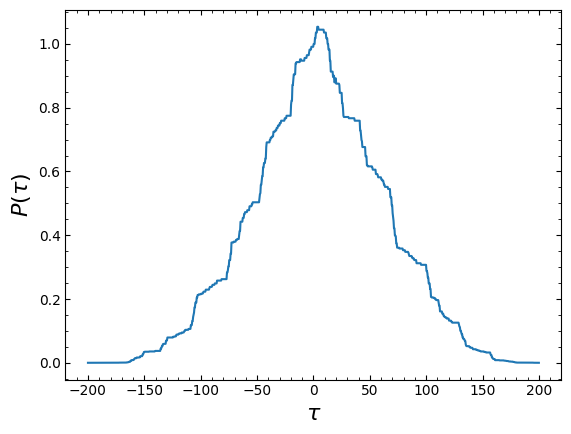

In [6]:
from pypetal import utils

weights, lags = utils.prob_tau(x1, x2, laglim=[-200,200], Nlag=1000)

plt.plot(lags, weights)
plt.xlabel(r'$\tau$', fontsize=16)
plt.ylabel(r'$P(\tau)$', fontsize=16)
plt.show()

If ``use_weights=True``, PETL will use this scheme to weight the output posterior distribution for the time lag for each line. The median of this weighted distribution will then be used as the best-fit value for the time lag.

Now, we'll run pyPetal using ``use_weights=True``:


Running JAVELIN
--------------------
rm_type: spec
lagtobaseline: 0.3
laglimit: baseline
fixed: False
p_fix: False
subtract_mean: True
nwalker: 100
nburn: 100
nchain: 100
threads: 1
output_chains: True
output_burn: True
output_logp: True
nbin: 50
metric: med
together: True
use_weights: True
--------------------
        
start burn-in
nburn: 100 nwalkers: 100 --> number of burn-in iterations: 10000
burn-in finished
save burn-in chains to javelin_output4/javelin/burn_cont.txt
start sampling
sampling finished
acceptance fractions for all walkers are
0.58 0.61 0.79 0.71 0.64 0.72 0.66 0.75 0.71 0.64 0.72 0.79 0.69 0.61 0.62 0.69 0.62 0.70 0.64 0.73 0.63 0.62 0.74 0.69 0.69 0.67 0.70 0.73 0.66 0.74 0.62 0.68 0.71 0.66 0.68 0.75 0.72 0.71 0.69 0.65 0.70 0.57 0.70 0.69 0.73 0.74 0.71 0.68 0.74 0.87 0.70 0.69 0.73 0.65 0.70 0.70 0.69 0.72 0.74 0.60 0.66 0.64 0.63 0.71 0.71 0.64 0.75 0.70 0.66 0.64 0.73 0.76 0.70 0.68 0.72 0.75 0.70 0.72 0.77 0.78 0.73 0.66 0.79 0.76 0.74 0.61 0.69 0.67 0.75 0

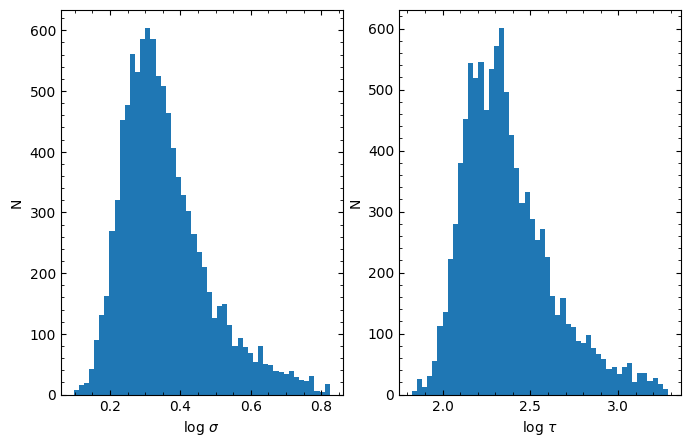

run single chain without subdividing matrix 
start burn-in
using priors on sigma and tau from continuum fitting
[[  1.759 137.627]
 [  2.153 211.668]
 [  2.955 400.642]]
penalize lags longer than 0.30 of the baseline
no penalizing long widths, but within the baseline
nburn: 100 nwalkers: 100 --> number of burn-in iterations: 10000
burn-in finished
save burn-in chains to javelin_output4/javelin/burn_rmap.txt
start sampling
sampling finished
acceptance fractions are
0.04 0.00 0.03 0.02 0.05 0.00 0.02 0.04 0.02 0.04 0.01 0.01 0.02 0.02 0.02 0.01 0.02 0.03 0.05 0.02 0.01 0.07 0.06 0.00 0.03 0.03 0.01 0.01 0.01 0.01 0.01 0.03 0.03 0.01 0.02 0.03 0.04 0.01 0.06 0.00 0.02 0.02 0.02 0.02 0.03 0.04 0.01 0.03 0.01 0.01 0.03 0.02 0.00 0.04 0.03 0.01 0.05 0.02 0.01 0.04 0.03 0.03 0.02 0.03 0.00 0.00 0.02 0.02 0.03 0.07 0.01 0.04 0.02 0.03 0.02 0.07 0.02 0.02 0.04 0.02 0.02 0.02 0.03 0.00 0.00 0.02 0.00 0.00 0.05 0.01 0.04 0.03 0.02 0.00 0.03 0.01 0.01 0.01 0.00 0.01
save MCMC chains to javelin_out

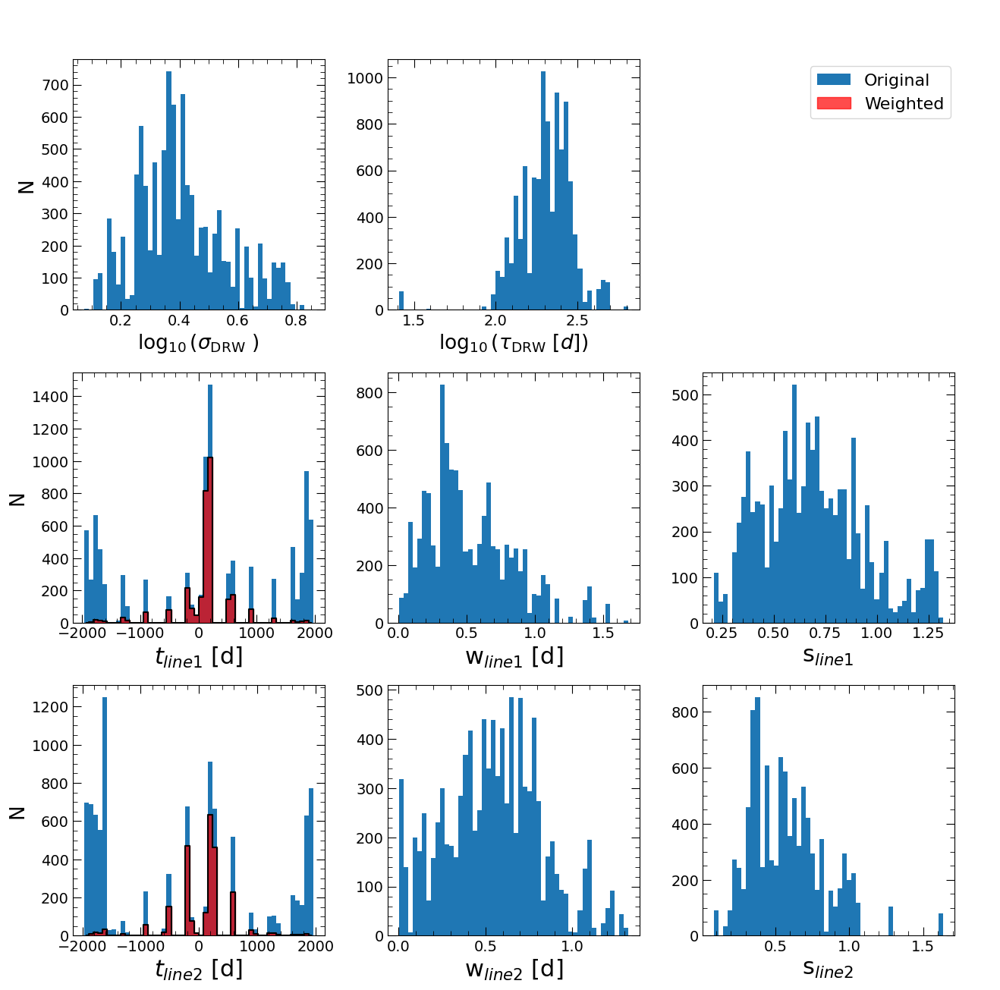

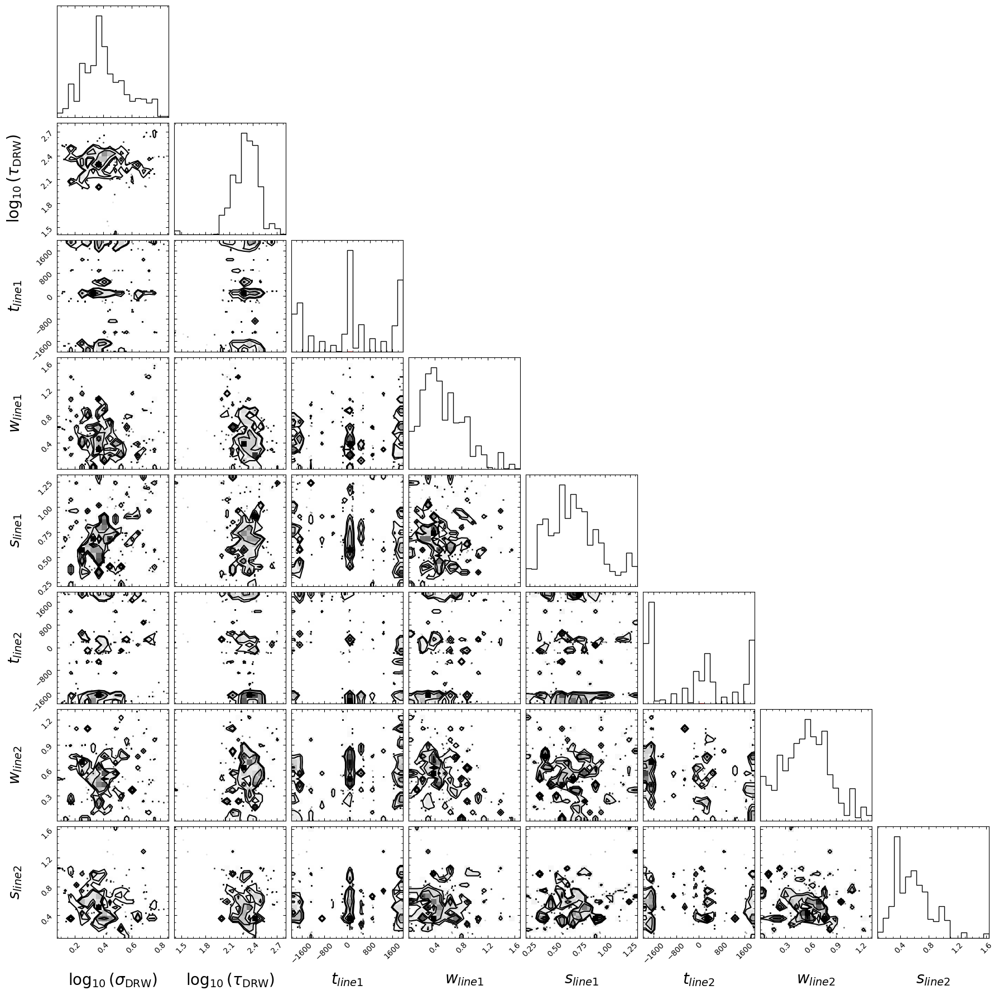

covariance matrix calculated
covariance matrix decomposed and updated by U


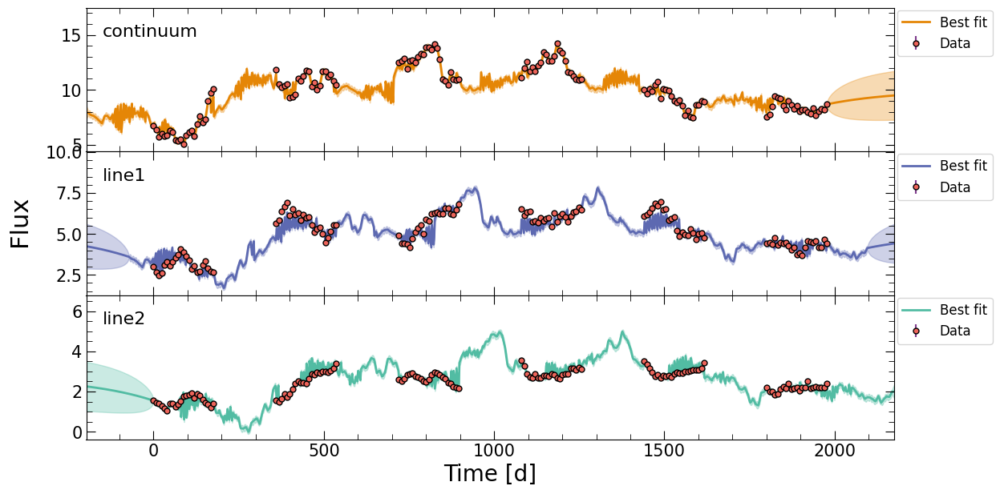

In [7]:
output_dir = 'javelin_output4/'

params = {
    'use_weights': True
}

res = pl.run_pipeline( output_dir, filenames, line_names,
                 run_javelin=True,
                 javelin_params=params,
                 verbose=True,
                 plot=True,
                 file_fmt='ascii')

### Photometric Reverberation Mapping

By default, the JAVELIN module will ssume that the input light curves are spectroscopic light curves, and perform spectrooscopic reverberation mapping (RM) analysis. However, pyPetal can also analyze light curves using photometric RM analysis.

This can be changed with the ``rm_type`` argument, which can be either "spec" or "phot". 

.. warning:: JAVELIN's photometric RM analysis can only be done with two light curves, so ``together`` must be set to ``False`` if ``rm_type=phot``.

We can run the JAVELIN module assuming photometric light curves, only using the continuum and first line:


Running JAVELIN
--------------------
rm_type: phot
lagtobaseline: 0.3
laglimit: [array(['baseline'], dtype='<U8')]
fixed: True
p_fix: True
subtract_mean: True
nwalker: 100
nburn: 100
nchain: 100
threads: 1
output_chains: True
output_burn: True
output_logp: True
nbin: 50
metric: med
together: False
use_weights: False
--------------------
        
start burn-in
nburn: 100 nwalkers: 100 --> number of burn-in iterations: 10000
burn-in finished
save burn-in chains to javelin_output5/line1/javelin/burn_cont.txt
start sampling
sampling finished
acceptance fractions for all walkers are
0.61 0.62 0.74 0.69 0.62 0.62 0.73 0.67 0.68 0.66 0.73 0.72 0.73 0.70 0.57 0.66 0.67 0.70 0.58 0.74 0.58 0.69 0.79 0.74 0.65 0.64 0.77 0.72 0.73 0.71 0.70 0.68 0.70 0.73 0.73 0.73 0.72 0.66 0.74 0.61 0.69 0.65 0.72 0.64 0.70 0.76 0.77 0.68 0.77 0.74 0.66 0.75 0.72 0.64 0.79 0.71 0.72 0.69 0.66 0.64 0.69 0.67 0.58 0.65 0.70 0.70 0.69 0.63 0.69 0.66 0.75 0.71 0.61 0.62 0.81 0.71 0.71 0.70 0.77 0.72 0.77 0.71 0.78

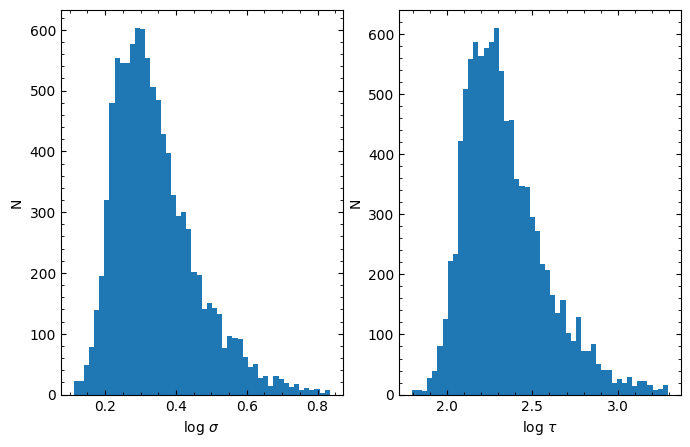

run single chain without subdividing matrix 
start burn-in
using priors on sigma and tau from continuum fitting
[[  1.72  132.15 ]
 [  2.094 198.244]
 [  2.825 368.375]]
penalize lags longer than 0.30 of the baseline
no penalizing long widths, but within the baseline
nburn: 100 nwalkers: 100 --> number of burn-in iterations: 10000
burn-in finished
save burn-in chains to javelin_output5/line1/javelin/burn_rmap.txt
start sampling
sampling finished
acceptance fractions are
0.10 0.05 0.07 0.06 0.10 0.12 0.11 0.06 0.08 0.06 0.09 0.08 0.05 0.01 0.05 0.10 0.06 0.09 0.10 0.06 0.03 0.05 0.09 0.08 0.04 0.03 0.15 0.08 0.05 0.07 0.06 0.08 0.09 0.05 0.07 0.08 0.12 0.05 0.06 0.06 0.09 0.09 0.06 0.01 0.10 0.11 0.00 0.09 0.04 0.02 0.05 0.05 0.15 0.08 0.06 0.06 0.04 0.11 0.10 0.10 0.01 0.09 0.04 0.08 0.07 0.09 0.05 0.10 0.14 0.10 0.08 0.05 0.09 0.14 0.11 0.06 0.10 0.04 0.00 0.10 0.09 0.08 0.04 0.05 0.07 0.07 0.07 0.10 0.03 0.04 0.05 0.13 0.00 0.03 0.06 0.09 0.13 0.04 0.05 0.13
save MCMC chains to javel

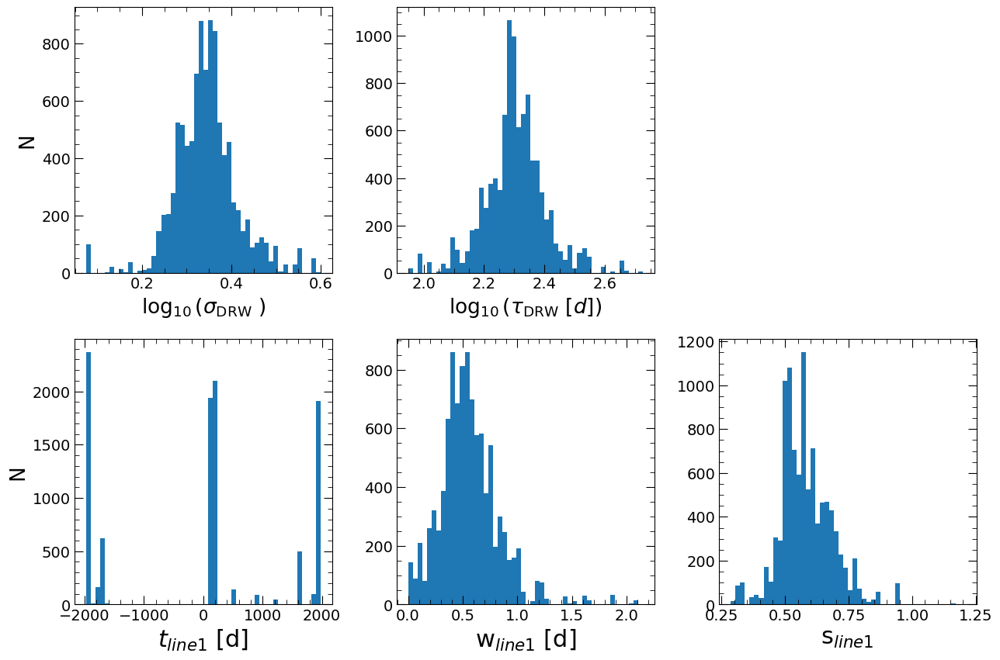

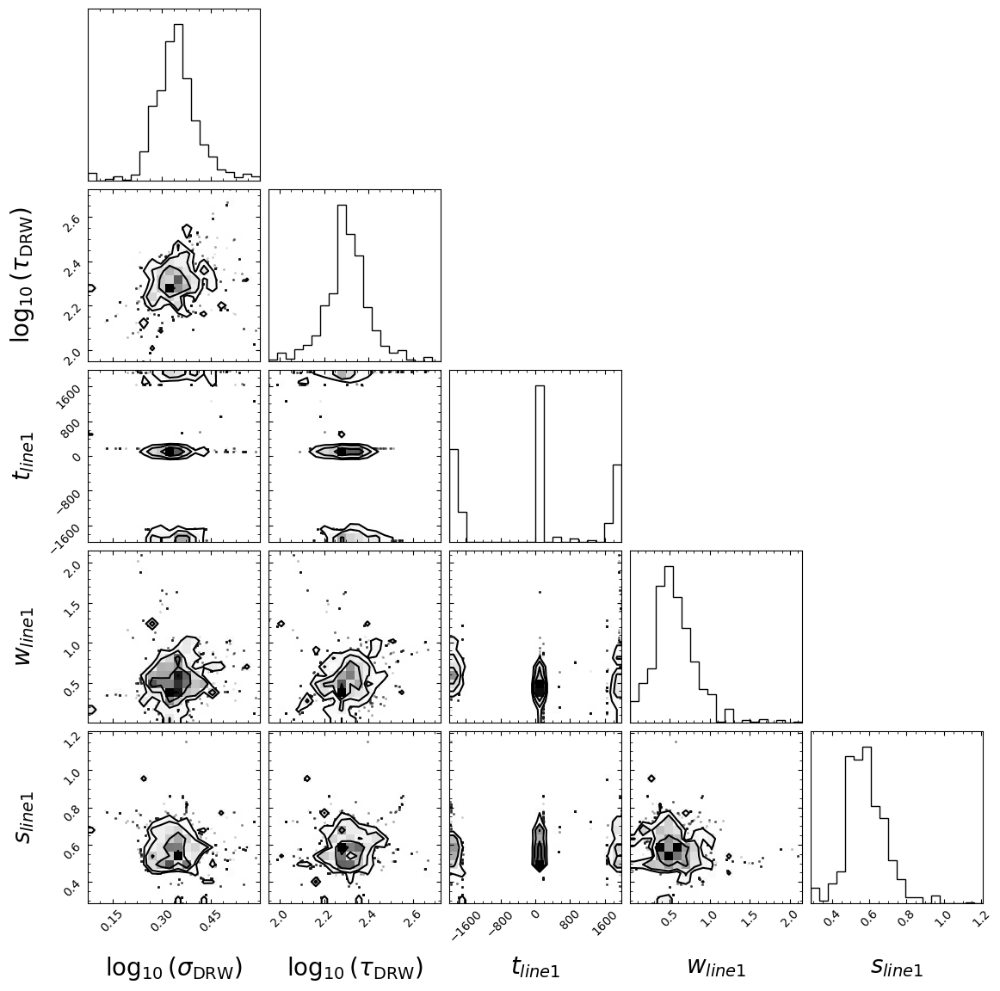

covariance matrix calculated
covariance matrix decomposed and updated by U


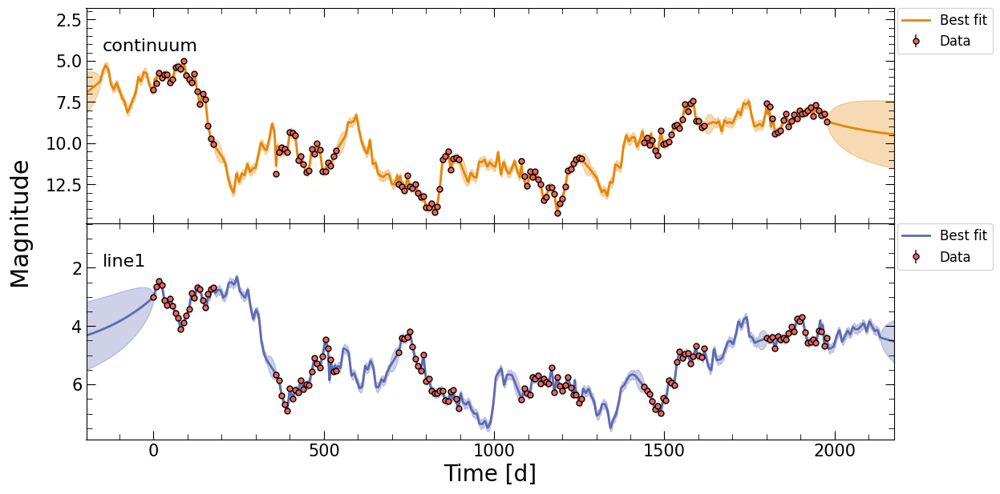

In [8]:
output_dir = 'javelin_output5/'

params = {
    'rm_type': "phot",
    'together': False
}

res = pl.run_pipeline( output_dir, filenames[:2], line_names[:2],
                 run_javelin=True,
                 javelin_params=params,
                 verbose=True,
                 plot=True,
                 file_fmt='ascii')

JAVELIN Output Files 
--------------------

JAVELIN's output files and figures depend on the input parameters given. If ``together=True``, the subdirectory containing all files/figures will be in ``output_dir/javelin/``. If ``together=False``, there will be a subdirectory for each line in ``output_dir/(line_name)/javelin/``.

The output subdirectory will have he following files, where ``(name)`` is the input name of the line:

* ``burn_cont.txt`` : The burn-in chains from the MCMC for the initial continuum fit 
* ``chain_cont.txt`` : The chains from the MCMC for the initial continuum fit
* ``logp_cont.txt``: The log-probability output from the MCMC for the initial continuum fit

* ``burn_rmap.txt``: The burn-in chains from the MCMC for the combined fit
* ``chain_rmap.txt``: The chains from the MCMC fit for the combined fit 
* ``logp_rmap.txt``: The log-probability output from the MCMC for the combined fit  

* ``(name)_lc_fits.dat``: The predicted light curve using the best-fit JAVELIN parameters. There will be one file for each line.

* ``javelin_bestfit.pdf``: A figure showing the fits to the light curves on top of the input data
* ``javelin_histogram.pdf``: A fgure showing the histograms for the posteriors for each of the JAVELIN parameters 

* ``cont_lcfile.dat``: A light curve file for the continuum data in JAVELIN format
* ``tot_lcfile.dat``: A light curve file for all light curves (continuum + lines) in JAVELIN format

If ``fixed`` is set to ``None`` (or all parameters are allowed to vary), a corner plot will also be produced:

* ``javelin_corner.pdf``: A corner plot for all of the JAVELIN parameters

.. note:: Outputting ``burn_x.txt``, ``chain_x.txt``, and ``logp_x.txt`` can be turned off by setting ``output_burn``, ``output_chain``, and ``output_logp`` to ``False`` in ``javelin_params``

JAVELIN Output Dict
-------------------

The JAVELIN module will output a ``dict`` containing a variety of data products from pyPetal's JAVELIN analysis. This ``dict`` will be stored in the total output ``dict`` under the key ``javelin_res``. If ``together=False``, this will be a list of ``dict``, one for each line.

This output ``dict`` will contain the following keys:

* ``cont_hpd``: The highest posterior density (HPD) interval for the initial continuum fit. If both DRW parameters are fixed, this will be ``None``. The first column corresponds to $\sigma_{\rm DRW}$, and the second corresponds to $\tau_{\rm DRW}$.

* ``tau``: The list of MCMC samples for $\tau_{\rm DRW}$.

* ``sigma``: The list of MCMC samples for $\sigma_{\rm DRW}$.

* ``tophat_params``: The list of MCMC samples for the tophat parameters. There will be $3\cdot(\rm number \ of \ lines)$ columns, grouped in threes for each line in the following order: (lag, width, scale).

* ``hpd``: The HPD interval for the combined fit. The first column corresponds to $\sigma_{\rm DRW}$, the second corresponds to $\tau_{\rm DRW}$, and the rest are the tophat parameters, in the same order as described in ``tophat_params``.

* ``cont_model``: The output javelin.lcmodel object for the initial continuum fit

* ``rmap_model``: The output javelin.lcmodel object for the combined fit

* ``cont_dat``: The continuum light curve in a javelin.LightCurve object
  
* ``tot_dat``: All light curves (continuum + lines) in a javelin.LightCurve object

* ``bestfit_model``: The best-fit javelin.lcmodel object for the light curves